In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder 
# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report 
# sklearn classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

In [2]:
# Load data
df = pd.read_csv('InSDN.csv')

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\3495296657.py:2: DtypeWarning: Columns (2,4,5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('InSDN.csv')


In [3]:
df

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,192.168.3.130-200.175.2.130-38694-4444-6,192.168.3.130,38694,200.175.2.130,4444,6,10/1/2020 5:02,269709,4,5,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
1,192.168.3.130-200.175.2.130-38693-4444-6,192.168.3.130,38693,200.175.2.130,4444,6,10/1/2020 5:02,268599,2,3,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
2,192.168.3.130-200.175.2.130-3632-33747-6,200.175.2.130,33747,192.168.3.130,3632,6,10/1/2020 5:02,22194,5,5,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
3,192.168.3.130-200.175.2.130-8180-38745-6,200.175.2.130,38745,192.168.3.130,8180,6,10/1/2020 1:39,9556,4,4,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,BFA
4,192.168.3.130-200.175.2.130-8180-37217-6,200.175.2.130,37217,192.168.3.130,8180,6,10/1/2020 1:39,8782,4,4,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,BFA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343887,172.17.0.2-200.175.2.130-80-55446-6,200.175.2.130,55446.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:00 PM,3431.0,2.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343888,172.17.0.2-200.175.2.130-80-55446-6,200.175.2.130,55446.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:00 PM,4121.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343889,172.17.0.2-200.175.2.130-80-55456-6,200.175.2.130,55456.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:05 PM,5887.0,2.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343890,172.17.0.2-200.175.2.130-80-55456-6,200.175.2.130,55456.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:05 PM,150.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack


In [4]:
df.head()

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,192.168.3.130-200.175.2.130-38694-4444-6,192.168.3.130,38694,200.175.2.130,4444,6,10/1/2020 5:02,269709,4,5,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
1,192.168.3.130-200.175.2.130-38693-4444-6,192.168.3.130,38693,200.175.2.130,4444,6,10/1/2020 5:02,268599,2,3,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
2,192.168.3.130-200.175.2.130-3632-33747-6,200.175.2.130,33747,192.168.3.130,3632,6,10/1/2020 5:02,22194,5,5,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,U2R
3,192.168.3.130-200.175.2.130-8180-38745-6,200.175.2.130,38745,192.168.3.130,8180,6,10/1/2020 1:39,9556,4,4,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,BFA
4,192.168.3.130-200.175.2.130-8180-37217-6,200.175.2.130,37217,192.168.3.130,8180,6,10/1/2020 1:39,8782,4,4,...,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,BFA


In [5]:
df.tail()

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
343887,172.17.0.2-200.175.2.130-80-55446-6,200.175.2.130,55446.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:00 PM,3431.0,2.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343888,172.17.0.2-200.175.2.130-80-55446-6,200.175.2.130,55446.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:00 PM,4121.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343889,172.17.0.2-200.175.2.130-80-55456-6,200.175.2.130,55456.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:05 PM,5887.0,2.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343890,172.17.0.2-200.175.2.130-80-55456-6,200.175.2.130,55456.0,172.17.0.2,80.0,6.0,25/12/2019 05:20:05 PM,150.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Web-Attack
343891,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.dtypes

Flow ID      object
Src IP       object
Src Port     object
Dst IP       object
Dst Port     object
              ...  
Idle Mean    object
Idle Std     object
Idle Max     object
Idle Min     object
Label        object
Length: 84, dtype: object

In [7]:
# Display the unique values in the 'Label' column
unique_labels = df['Label'].unique()
print(unique_labels)

['U2R' 'BFA' 'DDoS' 'DoS' 'Probe' 'Label' 'Normal' 'DDoS ' 'Web-Attack'
 'BOTNET' nan]


In [8]:
# Remove NaN values from the 'Label' column
df = df.dropna(subset=['Label'])

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'Label' column
df['Label_encoded'] = label_encoder.fit_transform(df['Label'])

# Create a mapping of original values to encoded values
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Display the unique values in the 'Label' column
unique_labels = df['Label'].unique()
print("Unique original values in 'Label' column:", unique_labels)

# Display the unique encoded values in the 'Label_encoded' column
unique_encoded_labels = df['Label_encoded'].unique()
print("Unique encoded values in 'Label_encoded' column:", unique_encoded_labels)

# Display the mapping of original to encoded values
print("Mapping of original to encoded values:")
for original, encoded in label_mapping.items():
    print(f"{original}: {encoded}")

# Display the count of each unique value in the 'Label_encoded' column
label_counts = df['Label_encoded'].value_counts()
print("Count of each unique value in 'Label_encoded' column:")
print(label_counts)


Unique original values in 'Label' column: ['U2R' 'BFA' 'DDoS' 'DoS' 'Probe' 'Label' 'Normal' 'DDoS ' 'Web-Attack'
 'BOTNET']
Unique encoded values in 'Label_encoded' column: [8 0 2 4 7 5 6 3 9 1]
Mapping of original to encoded values:
BFA: 0
BOTNET: 1
DDoS: 2
DDoS : 3
DoS: 4
Label: 5
Normal: 6
Probe: 7
U2R: 8
Web-Attack: 9
Count of each unique value in 'Label_encoded' column:
Label_encoded
7    98129
2    73529
6    68424
4    53616
3    48413
0     1405
9      192
1      164
8       17
5        2
Name: count, dtype: int64


C:\Users\USER\AppData\Local\Temp\ipykernel_16660\3211710323.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Label_encoded'] = label_encoder.fit_transform(df['Label'])


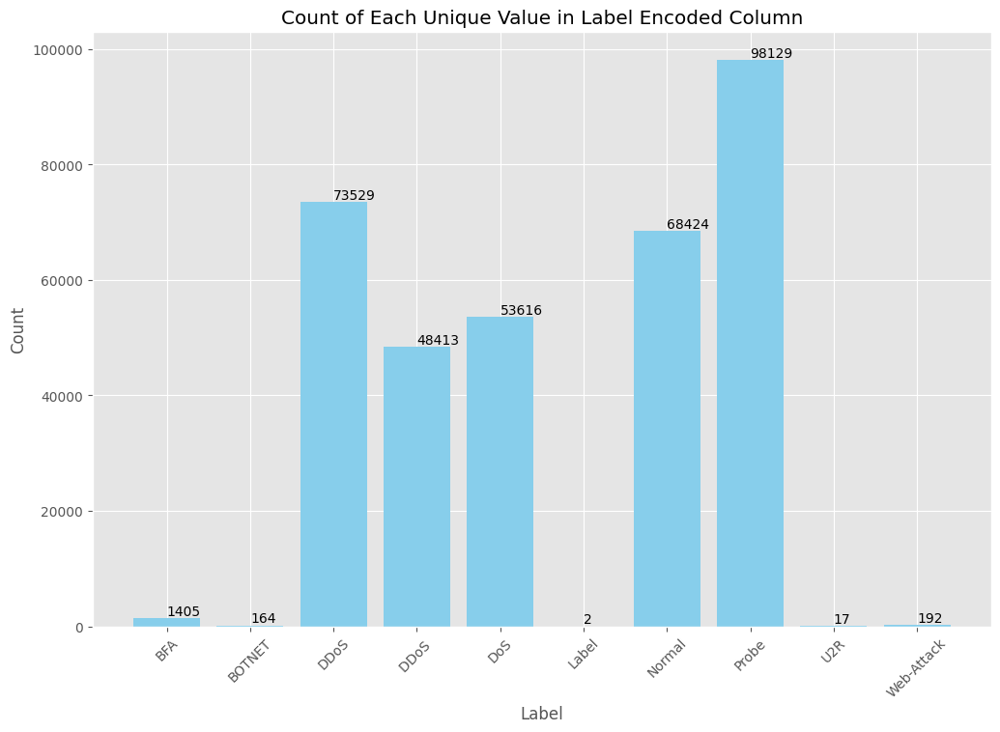

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Data as obtained
data = {
    'Label': ['BFA', 'BOTNET', 'DDoS', 'DDoS ', 'DoS', 'Label', 'Normal', 'Probe', 'U2R', 'Web-Attack'],
    'Label_encoded': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
    'count': [1405, 164, 73529, 48413, 53616, 2, 68424, 98129, 17, 192]
}

# Create DataFrame
df_counts = pd.DataFrame(data)

# Plot the bar graph
plt.figure(figsize=(12, 8))
bars = plt.bar(df_counts['Label'], df_counts['count'], color='skyblue')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Count of Each Unique Value in Label Encoded Column')
plt.xticks(rotation=45)

# Add count labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom')  # va: vertical alignment

plt.show()


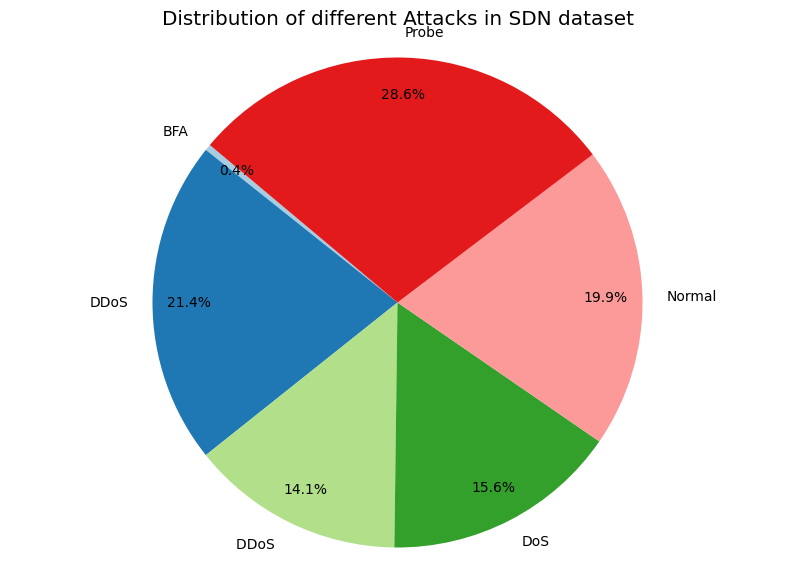

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Data as obtained, excluding 'BOTNET', 'Label', and 'U2R'
data = {
    'Label': ['BFA', 'DDoS', 'DDoS ', 'DoS', 'Normal', 'Probe'],
    'Label_encoded': [0, 2, 3, 4, 6, 7],
    'count': [1405, 73529, 48413, 53616, 68424, 98129]
}

# Create DataFrame
df_counts = pd.DataFrame(data)

# Plot the pie chart
plt.figure(figsize=(10, 7))
plt.pie(
    df_counts['count'], 
    labels=df_counts['Label'], 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.Paired.colors,
    pctdistance=0.85,  # Distance of percentage labels from center
    labeldistance=1.1  # Distance of labels from center
)
plt.title('Distribution of different Attacks in SDN dataset')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


In [11]:
df.dtypes

Flow ID          object
Src IP           object
Src Port         object
Dst IP           object
Dst Port         object
                  ...  
Idle Std         object
Idle Max         object
Idle Min         object
Label            object
Label_encoded     int32
Length: 85, dtype: object

In [12]:
# Apply label encoding to the 'Flow ID' column
flow_id_encoder = LabelEncoder()
df['Flow ID'] = flow_id_encoder.fit_transform(df['Flow ID'])

# Create the mapping for 'Flow ID'
flow_id_mapping = dict(zip(flow_id_encoder.classes_, flow_id_encoder.transform(flow_id_encoder.classes_)))

# Display the encoded DataFrame for 'Flow ID'
df_encoded_flow_id = df[['Flow ID']].copy()
print(df_encoded_flow_id)

# Display the mapping for 'Flow ID'
print("Flow ID Mapping:")
for original, encoded in flow_id_mapping.items():
    print(f"{original}: {encoded}")

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\515482067.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Flow ID'] = flow_id_encoder.fit_transform(df['Flow ID'])


        Flow ID
0        178591
1        178590
2        178301
3        196726
4        196712
...         ...
343886    25156
343887    25157
343888    25157
343889    25158
343890    25158

[343891 rows x 1 columns]
Flow ID Mapping:
128.0.213.144-192.168.3.130-0-0-0: 0
128.0.216.241-192.168.3.130-0-0-0: 1
128.0.252.169-192.168.3.130-0-0-0: 2
128.0.29.177-192.168.3.130-0-0-0: 3
128.1.50.103-192.168.3.130-0-0-0: 4
128.101.14.175-192.168.20.134-0-0-0: 5
128.101.164.131-192.168.20.134-0-0-0: 6
128.101.171.226-192.168.20.134-0-0-0: 7
128.101.87.77-192.168.20.134-0-0-0: 8
128.102.119.21-192.168.3.130-0-0-0: 9
128.102.128.105-192.168.3.130-0-0-0: 10
128.102.181.173-192.168.3.130-0-0-0: 11
128.102.25.143-192.168.3.130-0-0-0: 12
128.102.34.241-192.168.3.130-0-0-0: 13
128.102.51.145-192.168.3.130-0-0-0: 14
128.102.69.145-192.168.3.130-0-0-0: 15
128.103.110.145-192.168.3.130-0-0-0: 16
128.103.118.200-192.168.3.130-0-0-0: 17
128.103.151.31-192.168.3.130-0-0-0: 18
128.103.153.29-192.168.3.130-0-

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [13]:
# Apply label encoding to the 'Src IP' column
src_ip_encoder = LabelEncoder()
df['Src IP'] = src_ip_encoder.fit_transform(df['Src IP'])

# Create the mapping for 'Src IP'
src_ip_mapping = dict(zip(src_ip_encoder.classes_, src_ip_encoder.transform(src_ip_encoder.classes_)))

# Display the encoded DataFrame for 'Src IP'
print(df[['Src IP']].head())

# Display the mapping for 'Src IP'
print("Src IP Mapping:")
for original, encoded in src_ip_mapping.items():
    print(f"{original}: {encoded}")

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\907506951.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Src IP'] = src_ip_encoder.fit_transform(df['Src IP'])


   Src IP
0   55008
1   55008
2   59757
3   59757
4   59757
Src IP Mapping:
1.1.128.28: 0
1.1.148.200: 1
1.1.249.175: 2
1.102.104.185: 3
1.102.197.21: 4
1.102.29.182: 5
1.103.119.226: 6
1.105.96.124: 7
1.107.162.132: 8
1.107.214.63: 9
1.108.201.185: 10
1.109.143.211: 11
1.110.18.227: 12
1.115.181.70: 13
1.118.181.77: 14
1.118.36.117: 15
1.119.96.46: 16
1.128.208.122: 17
1.132.138.130: 18
1.132.185.20: 19
1.134.146.21: 20
1.137.151.28: 21
1.138.186.6: 22
1.139.174.70: 23
1.141.197.118: 24
1.141.22.124: 25
1.142.114.145: 26
1.142.161.241: 27
1.142.221.20: 28
1.145.183.113: 29
1.150.84.102: 30
1.153.225.40: 31
1.157.148.1: 32
1.158.255.248: 33
1.162.107.46: 34
1.162.244.25: 35
1.164.174.253: 36
1.165.129.132: 37
1.165.20.20: 38
1.165.220.25: 39
1.173.238.8: 40
1.174.176.109: 41
1.174.238.230: 42
1.174.51.248: 43
1.174.78.151: 44
1.182.213.111: 45
1.186.80.200: 46
1.187.109.174: 47
1.188.129.25: 48
1.188.253.153: 49
1.189.241.21: 50
1.189.7.41: 51
1.196.21.175: 52
1.2.105.164: 53
1.20.130.

In [14]:
# Apply label encoding to the 'Dst IP' column
dst_ip_encoder = LabelEncoder()
df['Dst IP'] = dst_ip_encoder.fit_transform(df['Dst IP'])

# Create the mapping for 'Dst IP'
dst_ip_mapping = dict(zip(dst_ip_encoder.classes_, dst_ip_encoder.transform(dst_ip_encoder.classes_)))

# Display the encoded DataFrame for 'Dst IP'
print(df[['Dst IP']].head())

# Display the mapping for 'Dst IP'
print("Dst IP Mapping:")
for original, encoded in dst_ip_mapping.items():
    print(f"{original}: {encoded}")

   Dst IP
0     387
1     387
2     350
3     350
4     350
Dst IP Mapping:
100.24.155.160: 0
104.102.43.111: 1
104.102.51.133: 2
104.102.52.114: 3
104.103.159.100: 4
104.103.192.172: 5
104.103.201.135: 6
104.103.226.100: 7
104.103.228.128: 8
104.103.240.95: 9
104.103.253.4: 10
104.117.160.209: 11
104.129.168.238: 12
104.16.125.175: 13
104.16.133.32: 14
104.16.134.32: 15
104.16.142.228: 16
104.16.160.13: 17
104.16.170.188: 18
104.16.171.188: 19
104.16.173.188: 20
104.16.202.237: 21
104.16.252.5: 22
104.16.54.111: 23
104.16.77.165: 24
104.16.78.165: 25
104.16.81.165: 26
104.16.86.20: 27
104.16.87.20: 28
104.16.92.60: 29
104.17.119.107: 30
104.17.156.84: 31
104.17.167.85: 32
104.17.211.204: 33
104.17.64.4: 34
104.17.65.4: 35
104.17.67.176: 36
104.17.98.21: 37
104.17.99.21: 38
104.18.20.226: 39
104.18.21.226: 40
104.18.24.243: 41
104.18.25.243: 42
104.18.34.191: 43
104.18.35.115: 44
104.18.43.217: 45
104.18.48.94: 46
104.18.60.94: 47
104.18.70.113: 48
104.18.71.113: 49
104.19.214.37: 50
1

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\2220354117.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Dst IP'] = dst_ip_encoder.fit_transform(df['Dst IP'])


In [15]:
df.dtypes

Flow ID           int32
Src IP            int32
Src Port         object
Dst IP            int32
Dst Port         object
                  ...  
Idle Std         object
Idle Max         object
Idle Min         object
Label            object
Label_encoded     int32
Length: 85, dtype: object

In [16]:
# Convert all values in 'Src Port' to strings
df['Src Port'] = df['Src Port'].astype(str)

# Apply label encoding to the 'Src Port' column
src_port_encoder = LabelEncoder()
df['Src Port'] = src_port_encoder.fit_transform(df['Src Port'])

# Create the mapping for 'Src Port'
src_port_mapping = dict(zip(src_port_encoder.classes_, src_port_encoder.transform(src_port_encoder.classes_)))

# Display the encoded DataFrame for 'Src Port'
print(df[['Src Port']].head())

# Display the mapping for 'Src Port'
print("Src Port Mapping:")
for original, encoded in src_port_mapping.items():
    print(f"{original}: {encoded}")

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\1668674169.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Src Port'] = df['Src Port'].astype(str)
C:\Users\USER\AppData\Local\Temp\ipykernel_16660\1668674169.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Src Port'] = src_port_encoder.fit_transform(df['Src Port'])


   Src Port
0      7646
1      7645
2      2523
3      7699
4      6121
Src Port Mapping:
0: 0
0.0: 1
10003: 2
10022: 3
10034: 4
10039: 5
10049: 6
10101: 7
10141: 8
10150: 9
10155: 10
10185: 11
10189: 12
10203: 13
10227: 14
10239: 15
10252: 16
10268: 17
10282: 18
10284: 19
10289: 20
10310: 21
10320: 22
10332: 23
10334: 24
10337: 25
10346: 26
10350: 27
10372: 28
10407: 29
10435: 30
10438: 31
10477: 32
10523: 33
10550: 34
10578: 35
10587: 36
10610: 37
10612: 38
10617: 39
10638: 40
10660: 41
10675: 42
10734: 43
10749: 44
10755: 45
10762: 46
10783: 47
10795: 48
10839: 49
10859: 50
10893: 51
10896: 52
10910: 53
10926: 54
1096: 55
10979: 56
10983: 57
11047: 58
11051: 59
11068: 60
11076: 61
11081: 62
111: 63
11103: 64
11115: 65
11135: 66
11145: 67
11171: 68
11172: 69
11180: 70
11185: 71
11218: 72
11272: 73
11274: 74
11279: 75
11364: 76
11370: 77
11374: 78
11384: 79
11412: 80
11475: 81
11486: 82
11532: 83
11549: 84
11577: 85
11607: 86
11610: 87
11626: 88
11634: 89
11667: 90
1170: 91
11721: 92


In [17]:
# List of columns to encode
columns_to_encode = ['Src Port', 'Protocol', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts', 
                     'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
                     'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s', 
                     'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
                     'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean', 
                     'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 
                     'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 
                     'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt', 
                     'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 
                     'Down/Up Ratio', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Fwd Byts/b Avg', 
                     'Fwd Pkts/b Avg', 'Fwd Blk Rate Avg', 'Bwd Byts/b Avg', 'Bwd Pkts/b Avg', 'Bwd Blk Rate Avg', 
                     'Subflow Fwd Pkts', 'Subflow Fwd Byts', 'Subflow Bwd Pkts', 'Subflow Bwd Byts', 'Init Fwd Win Byts',
                     'Init Bwd Win Byts', 'Fwd Act Data Pkts', 'Fwd Seg Size Min', 'Active Mean', 'Active Std', 
                     'Active Max', 'Active Min', 'Idle Mean', 'Idle Std', 'Idle Max', 'Idle Min']

# Initialize a dictionary to store label encoders for each column
label_encoders = {}

# Apply label encoding to each column
for column in columns_to_encode:
    df[column] = df[column].astype(str)
    label_encoders[column] = LabelEncoder()
    df[column] = label_encoders[column].fit_transform(df[column])

# Create mappings for each encoded column
label_mappings = {}
for column in columns_to_encode:
    label_mappings[column] = dict(zip(label_encoders[column].classes_, label_encoders[column].transform(label_encoders[column].classes_)))

# Display the encoded DataFrame for the specified columns
print(df[columns_to_encode].head())

# Display the mappings for each encoded column
for column, mapping in label_mappings.items():
    print(f"Mapping for {column}:")
    for original, encoded in mapping.items():
        print(f"{original}: {encoded}")
    print("\n")


C:\Users\USER\AppData\Local\Temp\ipykernel_16660\1312715096.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = df[column].astype(str)
C:\Users\USER\AppData\Local\Temp\ipykernel_16660\1312715096.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = label_encoders[column].fit_transform(df[column])
C:\Users\USER\AppData\Local\Temp\ipykernel_16660\1312715096.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

   Src Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0     26651         3          31375           358           488   
1     26650         3          31276           152           314   
2     16925         3          26049           423           488   
3     26709         3          88735           358           412   
4     24958         3          86293           358           412   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0             4551             2527             1188                0   
1                0             2527                0                0   
2             4767             3168             1188                0   
3             3195             3168             1188                0   
4             3195             3168             1188                0   

   Fwd Pkt Len Mean  ...  Fwd Act Data Pkts  Fwd Seg Size Min  Active Mean  \
0               609  ...                 94                 0            0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




21973.0: 6972
21975.0: 6973
21976.0: 6974
2198.0: 6975
21980.0: 6976
21985.0: 6977
21987.0: 6978
21988.0: 6979
2199.0: 6980
21999.0: 6981
22.0: 6982
220.0: 6983
2200.0: 6984
2201.0: 6985
22010.0: 6986
22011.0: 6987
22016.0: 6988
22017.0: 6989
2202.0: 6990
22021.0: 6991
2203.0: 6992
22039.0: 6993
2204.0: 6994
22043.0: 6995
22047.0: 6996
2205.0: 6997
2205171.0: 6998
22052.0: 6999
2206.0: 7000
22068.0: 7001
22069.0: 7002
2207.0: 7003
2208.0: 7004
22085.0: 7005
2209.0: 7006
22099.0: 7007
221.0: 7008
2210.0: 7009
22101.0: 7010
22106.0: 7011
22107.0: 7012
22109.0: 7013
2211.0: 7014
2212.0: 7015
22124.0: 7016
2213.0: 7017
2214.0: 7018
2215.0: 7019
22157.0: 7020
22158.0: 7021
2216.0: 7022
22160.0: 7023
22166.0: 7024
22169.0: 7025
2217.0: 7026
221701.0: 7027
2218.0: 7028
22180.0: 7029
22184.0: 7030
2219.0: 7031
221966.0: 7032
222.0: 7033
2220.0: 7034
22206.0: 7035
2221.0: 7036
2222.0: 7037
22221.0: 7038
2223.0: 7039
22230.0: 7040
22231.0: 7041
22235.0: 7042
2224.0: 7043
22242.0: 7044
22248.0: 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



6464.532072999999: 62522
6464.9070630000015: 62523
6464.960995: 62524
6464036.417: 62525
646447.4962: 62526
6465.1391840000015: 62527
6465.53181: 62528
6465.935436: 62529
64650.952520000006: 62530
646564.1341: 62531
64657.85708: 62532
6466.300971: 62533
6466.995: 62534
6467.540862: 62535
6467.606693: 62536
6467.638734: 62537
6467.858404: 62538
6467.905728: 62539
6468.432445: 62540
6468.88688: 62541
64686.12834: 62542
6469.741986: 62543
6469.939309: 62544
647.0027048: 62545
647.7053728: 62546
647.7098116000002: 62547
6470.218229: 62548
6470.411154: 62549
6470.496840999999: 62550
6470.723120000001: 62551
6470.899342000001: 62552
6470.91467: 62553
6470331.103999998: 62554
64708.95304: 62555
6471.441261: 62556
6471.540479: 62557
6471.898161: 62558
6472.459731: 62559
6472.6161090000005: 62560
6472.843795000001: 62561
647234.3137: 62562
6472988.996: 62563
6473.133298: 62564
6473.182143999999: 62565
6473.372946: 62566
6473.699692: 62567
64736.06211: 62568
6474.012531: 62569
6474.148613: 62570

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




97.10741294: 87287
97.11094926: 87288
97.11566476: 87289
97.129814: 87290
97.13924911: 87291
97.15340523: 87292
97.15812485: 87293
97.16284493: 87294
97.16756547: 87295
97.18645221: 87296
97.19117504: 87297
97.21007096: 87298
97.21952168: 87299
97.22357255: 87300
97.22424773: 87301
97.22897423: 87302
97.23606486: 87303
97.24315651: 87304
97.24473258: 87305
97.24788486: 87306
97.25734293: 87307
97.25970773: 87308
97.26207265: 87309
97.26680284: 87310
97.27626459: 87311
97.29046067: 87312
97.29992703: 87313
97.3039212: 87314
97.31886526: 87315
97.32360097: 87316
97.325969: 87317
97.32937685: 87318
97.33307378: 87319
97.33781087: 87320
97.34254843: 87321
97.34728644: 87322
97.34864025: 87323
97.35202492: 87324
97.35676386: 87325
97.36150326: 87326
97.37754773: 87327
97.38046548: 87328
97.38520719: 87329
97.38994936: 87330
97.39469199: 87331
97.39943508: 87332
97.41366714: 87333
97.41841208: 87334
97.42078472: 87335
97.42315748: 87336
97.42790335: 87337
97.43237047: 87338
97.43739647: 873

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



28100000.0: 199
28200000.0: 200
28300000.0: 201
28400000.0: 202
28500000.0: 203
28600000.0: 204
28700000.0: 205
28800000.0: 206
28900000.0: 207
29000000.0: 208
29100000.0: 209
29200000.0: 210
29300000.0: 211
29400000.0: 212
29500000.0: 213
29600000.0: 214
29700000.0: 215
29800000.0: 216
29900000.0: 217
30000000.0: 218
30100000.0: 219
30200000.0: 220
30300000.0: 221
30400000.0: 222
30500000.0: 223
30600000.0: 224
30700000.0: 225
30800000.0: 226
30900000.0: 227
31000000.0: 228
31100000.0: 229
31200000.0: 230
31300000.0: 231
31500000.0: 232
31600000.0: 233
31700000.0: 234
31800000.0: 235
31900000.0: 236
32000000.0: 237
32100000.0: 238
32200000.0: 239
32300000.0: 240
32400000.0: 241
32500000.0: 242
32600000.0: 243
32700000.0: 244
32800000.0: 245
32900000.0: 246
33000000.0: 247
33100000.0: 248
33200000.0: 249
33300000.0: 250
33400000.0: 251
33500000.0: 252
33600000.0: 253
33700000.0: 254
33800000.0: 255
33900000.0: 256
34000000.0: 257
34100000.0: 258
34200000.0: 259
34300000.0: 260
34400000

In [18]:
df.dtypes

Flow ID           int32
Src IP            int32
Src Port          int32
Dst IP            int32
Dst Port         object
                  ...  
Idle Std          int32
Idle Max          int32
Idle Min          int32
Label            object
Label_encoded     int32
Length: 85, dtype: object

In [19]:
# Convert all values in 'Dst Port' to strings
df['Dst Port'] = df['Dst Port'].astype(str)

# Apply label encoding to the 'Dst Port' column
dst_port_encoder = LabelEncoder()
df['Dst Port'] = dst_port_encoder.fit_transform(df['Dst Port'])

# Create the mapping for 'Dst Port'
dst_port_mapping = dict(zip(dst_port_encoder.classes_, dst_port_encoder.transform(dst_port_encoder.classes_)))

# Display the encoded DataFrame for 'Dst Port'
print(df[['Dst Port']].head())

# Display the mapping for 'Dst Port'
print("Dst Port Mapping:")
for original, encoded in dst_port_mapping.items():
    print(f"{original}: {encoded}")

C:\Users\USER\AppData\Local\Temp\ipykernel_16660\968074494.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Dst Port'] = df['Dst Port'].astype(str)
C:\Users\USER\AppData\Local\Temp\ipykernel_16660\968074494.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Dst Port'] = dst_port_encoder.fit_transform(df['Dst Port'])


   Dst Port
0     15703
1     15703
2      6930
3     28603
4     28603
Dst Port Mapping:
0: 0
0.0: 1
1: 2
1.0: 3
10: 4
100: 5
100.0: 6
1000: 7
1000.0: 8
10000: 9
10000.0: 10
10001: 11
10001.0: 12
10002: 13
10002.0: 14
10003: 15
10003.0: 16
10004: 17
10004.0: 18
10009: 19
10009.0: 20
1001: 21
1001.0: 22
10010: 23
10010.0: 24
10012: 25
10012.0: 26
1002: 27
10024: 28
10024.0: 29
10025: 30
10025.0: 31
1003: 32
1004: 33
1005: 34
1006: 35
1007: 36
1008: 37
10082: 38
10082.0: 39
1009: 40
1009.0: 41
101: 42
1010: 43
1010.0: 44
1011: 45
1011.0: 46
1012: 47
1013: 48
1014: 49
1015: 50
1016: 51
1017: 52
1018: 53
10180: 54
10180.0: 55
1019: 56
102: 57
1020: 58
1021: 59
1021.0: 60
10215: 61
10215.0: 62
1022: 63
1022.0: 64
1023: 65
1023.0: 66
1024: 67
1024.0: 68
10243: 69
10243.0: 70
1025: 71
1025.0: 72
1026: 73
1026.0: 74
1027: 75
1027.0: 76
1028: 77
1028.0: 78
1029: 79
1029.0: 80
103: 81
1030: 82
1030.0: 83
1031: 84
1031.0: 85
1032: 86
1032.0: 87
1033: 88
1033.0: 89
1034: 90
1034.0: 91
1035: 92
10

In [20]:
df.dtypes

Flow ID           int32
Src IP            int32
Src Port          int32
Dst IP            int32
Dst Port          int32
                  ...  
Idle Std          int32
Idle Max          int32
Idle Min          int32
Label            object
Label_encoded     int32
Length: 85, dtype: object

In [21]:
# Save the DataFrame to a new CSV file
output_file_path = 'InSDN_Encoded.csv'
df.to_csv(output_file_path, index=False)

print(f"DataFrame has been saved to {output_file_path}")

DataFrame has been saved to InSDN_Encoded.csv


In [22]:
# Load data
data_pre = pd.read_csv('InSDN_Encoded.csv')

In [23]:
data_pre

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Label_encoded
0,178591,55008,26651,387,15703,3,10/1/2020 5:02,31375,358,488,...,0,0,0,0,0,0,0,0,U2R,8
1,178590,55008,26650,387,15703,3,10/1/2020 5:02,31276,152,314,...,0,0,0,0,0,0,0,0,U2R,8
2,178301,59757,16925,350,6930,3,10/1/2020 5:02,26049,423,488,...,0,0,0,0,0,0,0,0,U2R,8
3,196726,59757,26709,350,28603,3,10/1/2020 1:39,88735,358,412,...,0,0,0,0,0,0,0,0,BFA,0
4,196712,59757,24958,350,28603,3,10/1/2020 1:39,86293,358,412,...,0,0,0,0,0,0,0,0,BFA,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343886,25156,59757,15362,215,28373,4,25/12/2019 05:19:55 PM,33591,3,1,...,0,0,1,1,0,0,0,0,Web-Attack,9
343887,25157,59757,15367,215,28373,4,25/12/2019 05:20:00 PM,39280,153,489,...,0,0,1,1,0,0,0,0,Web-Attack,9
343888,25157,59757,15367,215,28373,4,25/12/2019 05:20:00 PM,44063,3,1,...,0,0,1,1,0,0,0,0,Web-Attack,9
343889,25158,59757,15377,215,28373,4,25/12/2019 05:20:05 PM,55334,153,489,...,0,0,1,1,0,0,0,0,Web-Attack,9


In [24]:
data_pre.dtypes

Flow ID           int64
Src IP            int64
Src Port          int64
Dst IP            int64
Dst Port          int64
                  ...  
Idle Std          int64
Idle Max          int64
Idle Min          int64
Label            object
Label_encoded     int64
Length: 85, dtype: object

In [25]:
# Display the unique values of the 'Label_encoded' column
unique_values = data_pre['Label_encoded'].unique()
print("Unique values in 'Label_encoded' column:")
print(unique_values)

Unique values in 'Label_encoded' column:
[8 0 2 4 7 5 6 3 9 1]


In [26]:
# Display the count of unique values in the 'Label_encoded' column
unique_value_counts = data_pre['Label_encoded'].value_counts()
print("\nCount of unique values in 'Label_encoded' column:")
print(unique_value_counts)


Count of unique values in 'Label_encoded' column:
Label_encoded
7    98129
2    73529
6    68424
4    53616
3    48413
0     1405
9      192
1      164
8       17
5        2
Name: count, dtype: int64


In [27]:
import pandas as pd

# Assuming data_pre is already loaded
# For example: data_pre = pd.read_csv('your_file.csv')

# 1) Copy the data of data_pre to a new CSV file named InSDN_Encoded_Binary.csv
data_pre.to_csv('InSDN_Encoded_Binary.csv', index=False)

# 2) Update the values of Label_encoded column
data_pre['Label_encoded'] = data_pre['Label_encoded'].apply(lambda x: 0 if x == 6 else 1)

# Save the updated DataFrame to InSDN_Encoded_Binary.csv
data_pre.to_csv('InSDN_Encoded_Binary.csv', index=False)

# 3) Load the data of InSDN_Encoded_Binary.csv into a new dataframe named data_pre_binary
data_pre_binary = pd.read_csv('InSDN_Encoded_Binary.csv')

# Display the updated data_pre and data_pre_binary DataFrames
print("Updated data_pre:")
print(data_pre.head())

print("\nNew data_pre_binary:")
print(data_pre_binary.head())


Updated data_pre:
   Flow ID  Src IP  Src Port  Dst IP  Dst Port  Protocol       Timestamp  \
0   178591   55008     26651     387     15703         3  10/1/2020 5:02   
1   178590   55008     26650     387     15703         3  10/1/2020 5:02   
2   178301   59757     16925     350      6930         3  10/1/2020 5:02   
3   196726   59757     26709     350     28603         3  10/1/2020 1:39   
4   196712   59757     24958     350     28603         3  10/1/2020 1:39   

   Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  ...  Active Mean  Active Std  \
0          31375           358           488  ...            0           0   
1          31276           152           314  ...            0           0   
2          26049           423           488  ...            0           0   
3          88735           358           412  ...            0           0   
4          86293           358           412  ...            0           0   

   Active Max  Active Min  Idle Mean  Idle Std  Idle Max

In [28]:
# Display the unique values of the 'Label_encoded' column
unique_values = data_pre_binary['Label_encoded'].unique()
print("Unique values in 'Label_encoded' column:")
print(unique_values)

# Display the count of unique values in the 'Label_encoded' column
unique_value_counts = data_pre_binary['Label_encoded'].value_counts()
print("\nCount of unique values in 'Label_encoded' column:")
print(unique_value_counts)

Unique values in 'Label_encoded' column:
[1 0]

Count of unique values in 'Label_encoded' column:
Label_encoded
1    275467
0     68424
Name: count, dtype: int64


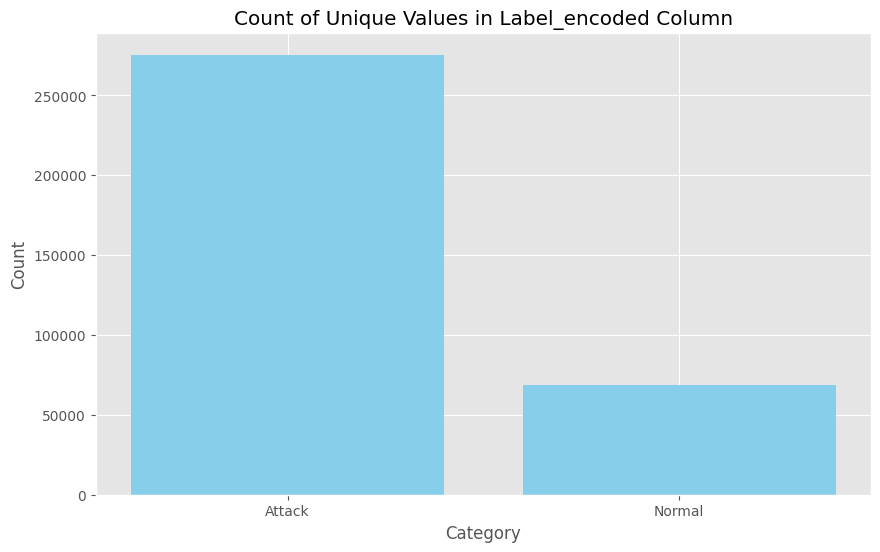

In [29]:
import matplotlib.pyplot as plt

# Data for the counts of unique values in 'Label_encoded' column
label_counts = {'Label_encoded': [1, 0], 'Count': [275467, 68424]}

# Create a DataFrame
df_counts = pd.DataFrame(label_counts)

# Replace the labels
df_counts['Label_encoded'] = df_counts['Label_encoded'].replace({0: 'Normal', 1: 'Attack'})

# Plot the bar graph
plt.figure(figsize=(10, 6))
plt.bar(df_counts['Label_encoded'], df_counts['Count'], color='skyblue')
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Count of Unique Values in Label_encoded Column')
plt.show()


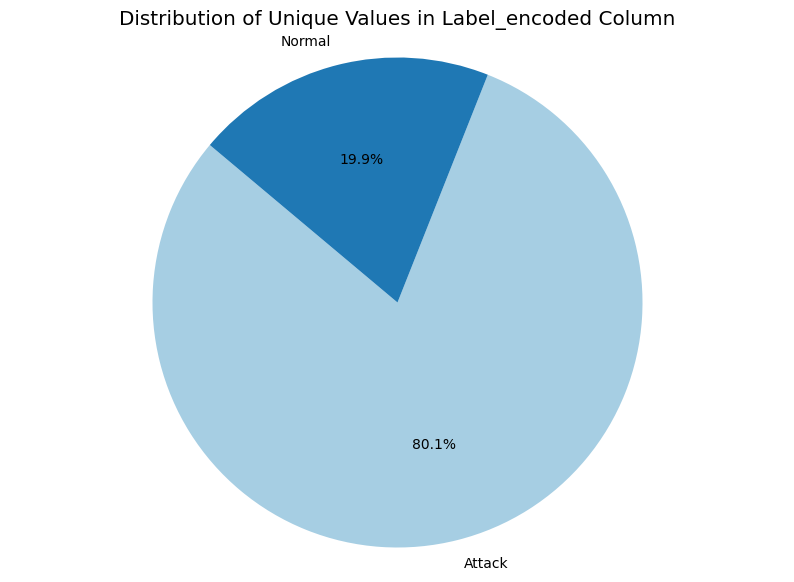

In [30]:
import matplotlib.pyplot as plt

# Data for the counts of unique values in 'Label_encoded' column
label_counts = {'Label_encoded': ['Attack', 'Normal'], 'Count': [275467, 68424]}

# Create a DataFrame
df_counts = pd.DataFrame(label_counts)

# Plot the pie chart
plt.figure(figsize=(10, 7))
plt.pie(df_counts['Count'], labels=df_counts['Label_encoded'], autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('Distribution of Unique Values in Label_encoded Column')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


In [35]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Load the dataset
data_pre_binary = pd.read_csv('InSDN_Encoded_Binary_v1.csv')

# Define the features (X) and the target (y)
X = data_pre_binary.drop(columns=['Label_encoded'])
y = data_pre_binary['Label_encoded']

# Handle missing values in X using mean imputation
imputer_X = SimpleImputer(strategy='mean')
X = pd.DataFrame(imputer_X.fit_transform(X), columns=X.columns)

# Handle missing values in y using most frequent value
imputer_y = SimpleImputer(strategy='most_frequent')
y = imputer_y.fit_transform(y.values.reshape(-1, 1)).ravel()

# Check class distribution in y
print("Class distribution in the target variable:")
print(pd.Series(y).value_counts())

# Initialize SelectKBest with chi-squared test
selector = SelectKBest(chi2, k=10)  # Adjust k as needed

# Fit and transform the data
X_selected = selector.fit_transform(X, y)

# Get the selected features
selected_features = X.columns[selector.get_support()]

print("\nSelected features using SelectKBest:")
print(selected_features)

# Split the data into training and testing sets with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.5, random_state=42, stratify=y
)

# Verify class distribution after splitting
print("\nTraining set class distribution:")
print(pd.Series(y_train).value_counts())
print("\nTest set class distribution:")
print(pd.Series(y_test).value_counts())

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

# Verify class distribution after applying SMOTE
print("\nTraining set class distribution after SMOTE:")
print(pd.Series(y_train).value_counts())

# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"\nAccuracy: {accuracy}")
print("\nClassification Report:")
print(report)


Selected features using SelectKBest:
Index(['Flow ID', 'TotLen Bwd Pkts', 'Fwd Pkt Len Mean', 'Flow Byts/s',
       'Flow IAT Std', 'Bwd IAT Std', 'Fwd Pkts/s', 'Pkt Len Std',
       'Pkt Len Var', 'Fwd Seg Size Avg'],
      dtype='object')
Accuracy: 0.942414314516129
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.79      0.85     20750
           1       0.95      0.98      0.96     82418

    accuracy                           0.94    103168
   macro avg       0.93      0.88      0.91    103168
weighted avg       0.94      0.94      0.94    103168

